In [73]:
from keras.preprocessing.image import ImageDataGenerator
from keras import layers, Input, Model
from keras.callbacks import EarlyStopping, TensorBoard
import os
from shutil import rmtree
import matplotlib.pyplot as plt
import numpy as np

SOURCE = '/home/mniederer/workspace/data/first_source_patches'
LOG_DIR = '/home/mniederer/workspace/Geo-KI/logs/CNN_patches_material'
BATCH_SIZE = 30
EPOCHS = 50

# remove logs from previous executions
if os.path.isdir(os.path.join(LOG_DIR, 'train')):
    rmtree(os.path.join(LOG_DIR, 'train'))
if os.path.isdir(os.path.join(LOG_DIR, 'validation')):
    rmtree(os.path.join(LOG_DIR, 'validation'))

train_datagen = ImageDataGenerator(rescale=1./255, 
                                   rotation_range=0,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   #brightness_range=(0.05,0.05),
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   horizontal_flip=True,)
train_generator = train_datagen.flow_from_directory(os.path.join(SOURCE,'train'), 
                                                    target_size=(50, 50), 
                                                    batch_size=BATCH_SIZE, 
                                                    class_mode='categorical')

validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_directory(os.path.join(SOURCE,'validation'), 
                                                    target_size=(50, 50), 
                                                    batch_size=BATCH_SIZE, 
                                                    class_mode='categorical')
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(os.path.join(SOURCE,'test'), 
                                                    target_size=(50, 50), 
                                                    batch_size=BATCH_SIZE, 
                                                    class_mode='categorical')


Found 9785 images belonging to 4 classes.
Found 1223 images belonging to 4 classes.
Found 1225 images belonging to 4 classes.


In [74]:
X,y = train_generator.next()

/home/mniederer/anaconda3/envs/dl/lib/python3.10/site-packages/matplotlib/text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


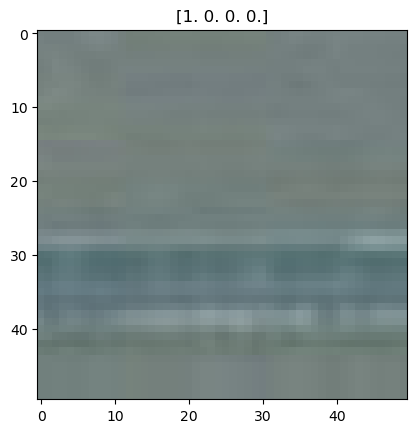

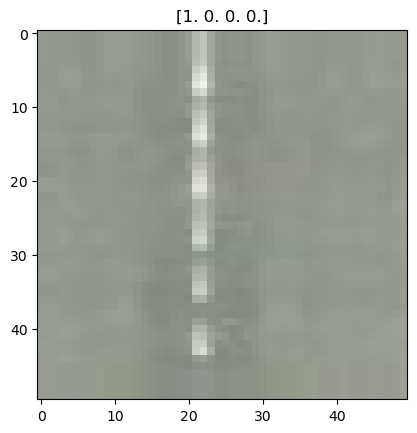

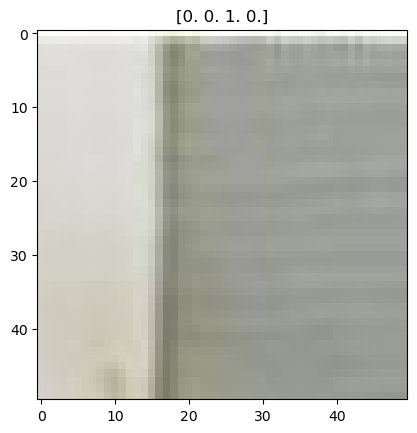

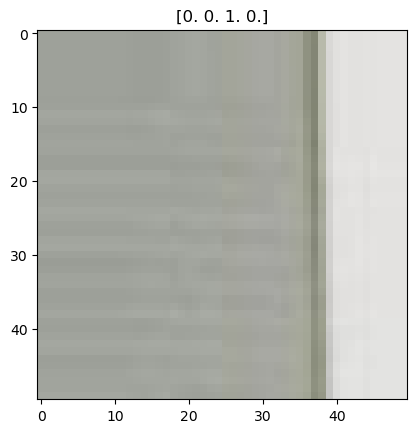

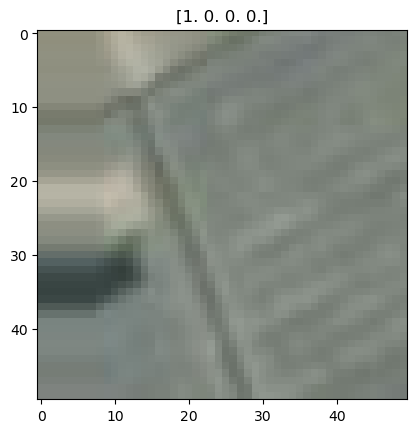

...

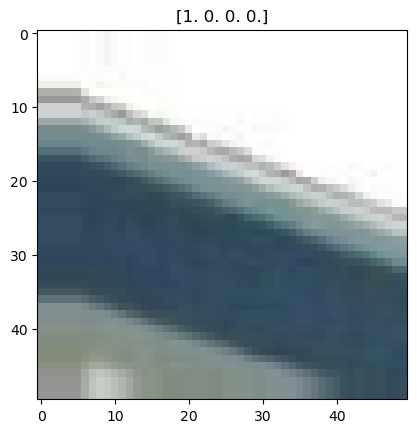

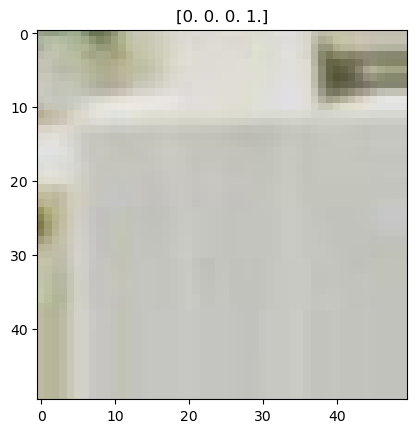

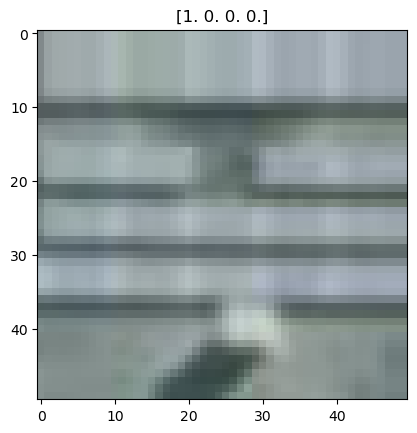

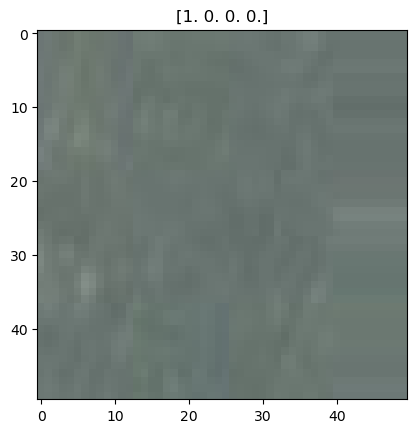

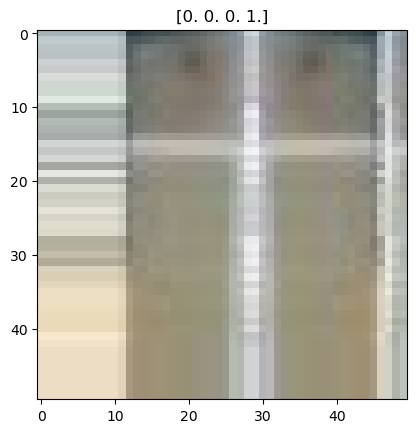

In [75]:
for i in range(X.shape[0]):
    plt.imshow(X[i])
    plt.title(y[i])
    plt.show()

## Model architecture

In [76]:
inputs = Input(shape=(50,50,3))
x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
x = layers.MaxPooling2D((2, 2), 2)(x)
x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), 2)(x)
x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), 2)(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Flatten()(x)
x = layers.Dense(64, activation='relu')(x)
outputs = layers.Dense(4, activation='softmax')(x)

model = Model(inputs, outputs)
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 50, 50, 3)]       0         
                                                                 
 conv2d_12 (Conv2D)          (None, 50, 50, 32)        896       
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 25, 25, 32)       0         
 2D)                                                             
                                                                 
 conv2d_13 (Conv2D)          (None, 25, 25, 64)        18496     
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 12, 12, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 12, 12, 128)       7385

## Train Model

In [77]:
history = model.fit(train_generator, 
                      batch_size=BATCH_SIZE, 
                      epochs=EPOCHS,
                      validation_data=validation_generator,
                      callbacks=[#EarlyStopping('val_accuracy', patience=15, min_delta=0.001, restore_best_weights=True),
                                 TensorBoard(log_dir=LOG_DIR, histogram_freq=1)])

Epoch 1/50
327/327 [==============================] - 13s 40ms/step - loss: 0.6662 - accuracy: 0.7137 - val_loss: 0.5504 - val_accuracy: 0.7866
Epoch 2/50
327/327 [==============================] - 13s 39ms/step - loss: 0.5023 - accuracy: 0.8090 - val_loss: 0.4222 - val_accuracy: 0.8512
Epoch 3/50
327/327 [==============================] - 13s 39ms/step - loss: 0.4799 - accuracy: 0.8184 - val_loss: 0.4126 - val_accuracy: 0.8602
Epoch 4/50
327/327 [==============================] - 13s 40ms/step - loss: 0.4578 - accuracy: 0.8276 - val_loss: 0.3718 - val_accuracy: 0.8667
Epoch 5/50
327/327 [==============================] - 13s 39ms/step - loss: 0.4393 - accuracy: 0.8369 - val_loss: 0.3466 - val_accuracy: 0.8749
Epoch 6/50
327/327 [==============================] - 13s 40ms/step - loss: 0.4187 - accuracy: 0.8458 - val_loss: 0.3579 - val_accuracy: 0.8855
Epoch 7/50
327/327 [==============================] - 13s 41ms/step - loss: 0.4085 - accuracy: 0.8459 - val_loss: 0.3461 - val_accuracy:

## Training History

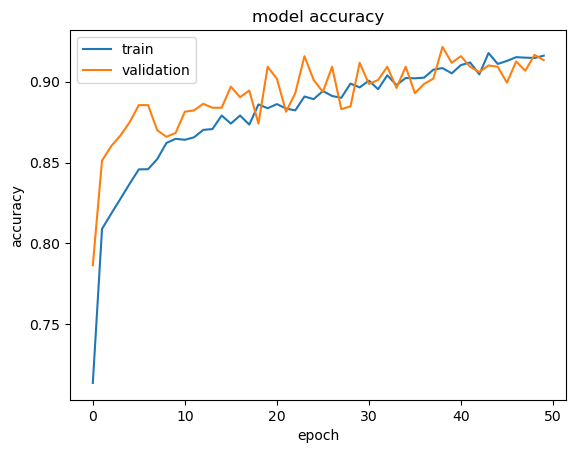

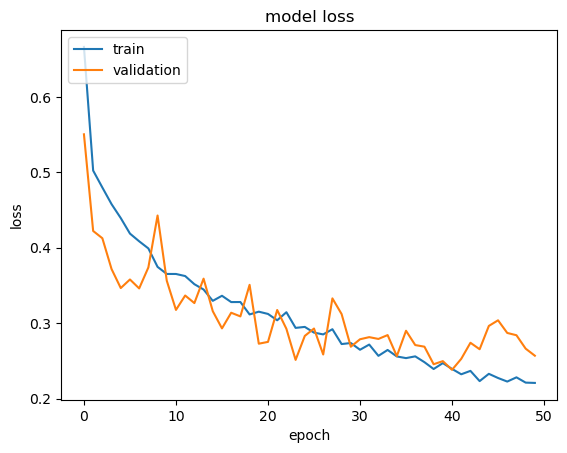

In [78]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

## Evaluation

In [79]:
score=model.evaluate(test_generator)

print("Test score:", score[0])
print("Test accuracy:", score[1])

41/41 [==============================] - 1s 18ms/step - loss: 0.2744 - accuracy: 0.9061
Test score: 0.27444761991500854
Test accuracy: 0.9061224460601807


In [80]:
import numpy as np
from sklearn.metrics import classification_report

roof_types = ['Bitumen', 'Eternit', 'Metall', 'Ziegel']


#get y_test
batch_size=50
num_batches=  int(len(test_generator.filenames) / batch_size)
batches_of_x= []
batches_of_y= []

for i in range(num_batches+1):
    x,y = test_generator[i]
    batches_of_y.append(np.argmax(y, axis=1))
    batches_of_x.append(x)

y_test = np.concatenate(batches_of_y, axis=0)
x_test = np.concatenate(batches_of_x, axis=0)
#generate predictions
y_pred = np.argmax(model.predict(x_test), axis=1)
print(classification_report(y_test, y_pred))

print('Classes:')
for i in range(len(roof_types)):
    print( '{} = {}'.format(i, roof_types[i]))


24/24 [==============================] - 0s 3ms/step
              precision    recall  f1-score   support

           0       0.96      0.85      0.90       287
           1       0.00      0.00      0.00         1
           2       0.80      0.91      0.85        88
           3       0.88      0.94      0.91       374

    accuracy                           0.90       750
   macro avg       0.66      0.67      0.67       750
weighted avg       0.90      0.90      0.90       750

Classes:
0 = Bitumen
1 = Eternit
2 = Metall
3 = Ziegel


/home/mniederer/anaconda3/envs/dl/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/mniederer/anaconda3/envs/dl/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/mniederer/anaconda3/envs/dl/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(resu

## Aggregating Predictions for whole images

### Preparing data

In [81]:
from PIL import Image

roof_Types_dict = { 'Bitumen':0, 'Eternit':1, 'Metall':2, 'Ziegel':3}
previous_id = '' 
imageList = []
current_image = []
y_test = []

for material in ['Metall', 'Bitumen', 'Eternit', 'Ziegel']:
    list = os.listdir(os.path.join(SOURCE, 'test', material))
    list.sort()
    for patch in list:
        new_image = Image.open(os.path.join(SOURCE, 'test', material,patch))
        new_image = np.array(new_image)
        current_id = patch.split('_')[0]
        # check for new id
        if(current_id != previous_id):
            imageList.append(current_image)
            y_test.append(roof_Types_dict[material])
            current_image = []

        current_image.append(new_image)
        previous_id = current_id

imageList.pop(0) #first item is empty list
y_test.pop(0)


2

### Evaluation

In [82]:
roof_Types_dict = { 'Bitumen':0, 'Eternit':1, 'Metall':2, 'Ziegel':3}

y_pred = []
for i in range(len(imageList)):
    prediction = model.predict(np.array(imageList[i]), verbose=0)
    prediction = prediction.argmax(axis=1)
    unique, counts = np.unique(prediction, return_counts=True)
    result = unique[counts.argmax()]
    if(result != y_test[i]):
        print(unique,counts)
    y_pred.append(result)


print(classification_report(y_test, y_pred))

print('Classes:')
for i in range(len(roof_types)):
    print( '{} = {}'.format(i, roof_types[i]))


[3] [17]
[3] [1]
[3] [1]
[3] [1]
[3] [2]
[3] [1]
[3] [13]
[3] [12]
[3] [1]
[3] [4]
[3] [6]
[3] [1]
[3] [1]
[3] [1]
[3] [4]
[3] [2]
[3] [1]
[3] [3]
[3] [2]
[3] [1]
[3] [8]
[3] [2]
[3] [1]
[3] [1]
[3] [1]
[3] [1]
[3] [1]
[3] [1]
[3] [1]
[3] [1]
[3] [3]
[3] [4]
[3] [1]
[3] [2]
[3] [1]
[3] [2]
[3] [1]
[3] [7]
[3] [2]
[3] [8]
[3] [1]
[3] [9]
[3] [2]
[3] [3]
[3] [2]
[3] [1]
[3] [1]
[3] [22]
[3] [1]
[3] [1]
[3] [9]
[3] [1]
[3] [1]
[3] [1]
[3] [16]
[3] [25]
[3] [2]
[3] [1]
[3] [1]
[3] [1]
[3] [2]
[3] [5]
[3] [1]
[3] [1]
[3] [1]
[3] [2]
[3] [8]
[3] [1]
[3] [1]
[3] [1]
[3] [1]
[3] [1]
[3] [1]
[3] [1]
[3] [1]
[3] [2]
[3] [1]
[3] [1]
[3] [1]
[3] [1]
[3] [1]
[3] [1]
[3] [2]
[3] [1]
[3] [2]
[3] [7]
[3] [114]
[3] [1]
[3] [1]
[3] [6]
[3] [138]
[3] [5]
[3] [20]
[3] [1]
[3] [1]
[3] [1]
[3] [5]
[3] [30]
[3] [2]
[3] [1]
[3] [1]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        56
           1       0.00      0.00      0.00         1
           2     

/home/mniederer/anaconda3/envs/dl/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/mniederer/anaconda3/envs/dl/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/mniederer/anaconda3/envs/dl/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(resu

## What went wrong?

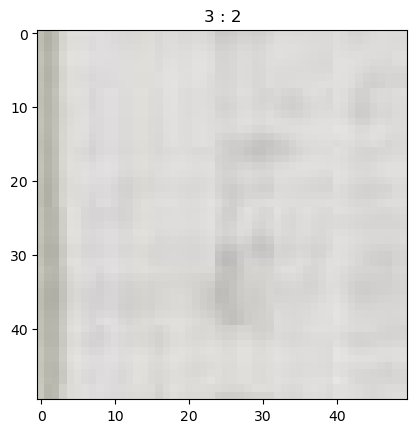

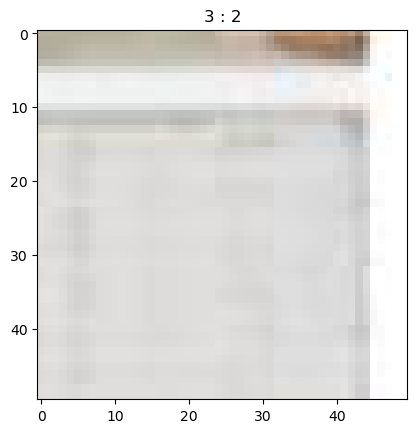

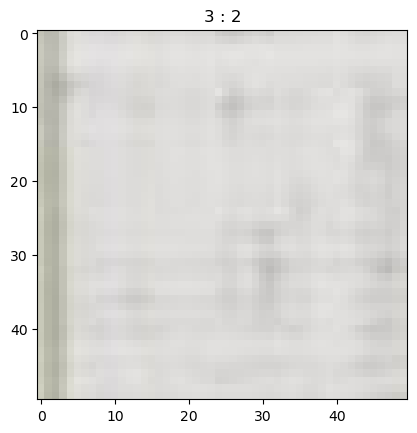

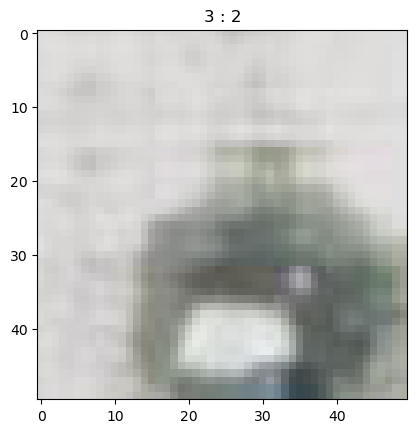

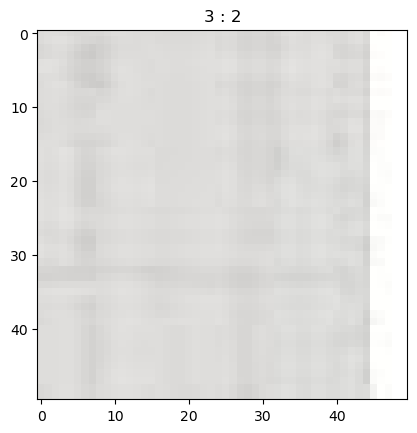

...

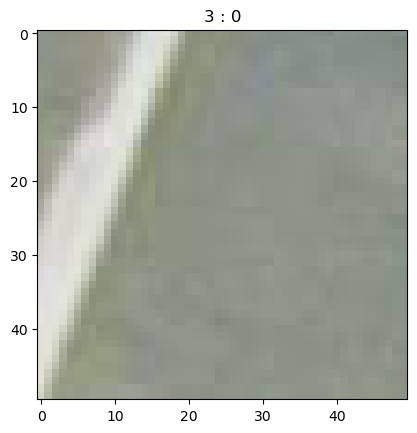

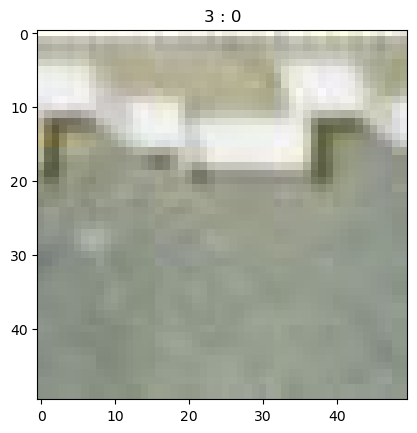

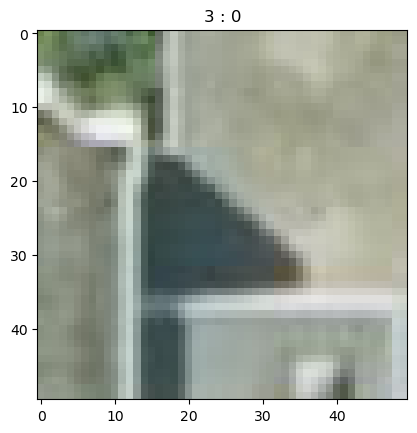

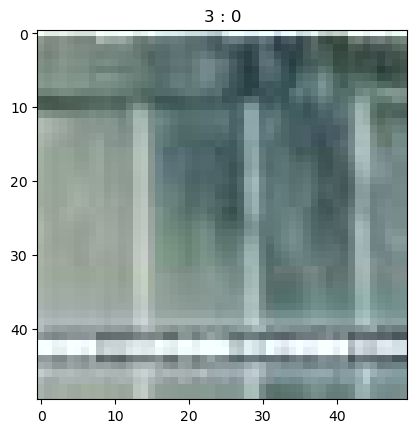

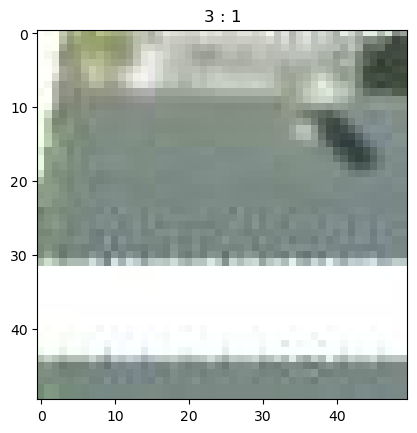

In [83]:
for i in range(len(imageList)):
    if(y_pred[i]!=y_test[i]):
        for patch in imageList[i]:
            title = str(y_pred[i]) +" : " +  str(y_test[i])
            plt.imshow(patch)
            plt.title(title)
            plt.show()